# Estabilización de ingresos

In [ ]:
def add_months(periodo,diff):
    '''
    Agrega un número de meses a un periodo con el formato YYYYMM
    input:
        periodo(str): periodo en el formato YYYYMM
        diff(int): número de meses que se agregará o quitará al periodo
    return:
        fecha(str): periodo final al que se agregó o quitó un determinado número de meses
    '''
    import pandas as pd
    from dateutil.relativedelta import relativedelta
    fecha = pd.to_datetime(periodo,format='%Y%m') +relativedelta(months=diff)
    
    return fecha.strftime("%Y%m")

In [68]:
def upload_blob(bucket_name, df, destination_blob_name,source_file_name):
    """Cargar archivos al bucket de GCP.
    input:
        bucket_name : "your-bucket-name" El ID del GCS bucket
        source_file_name : "local/path/to/file" Directorio del archivo a cargar
        destination_blob_name : "storage-object-name" El ID del objeto en GCS
    """
    import os
    from google.cloud import storage
    
    storage_client = storage.Client()
    bucket = storage_client.bucket(bucket_name)
    blob = bucket.blob(destination_blob_name + source_file_name)
    blob.upload_from_string(df, source_file_name)
    print("File {} uploaded to {}.".format(source_file_name, destination_blob_name + source_file_name))

# Preparación de datos

La unión de las fuentes se realizó en pyspark porque la fuente del sistema financiero tiene más de 11 millones de registros por periodo. Por lo tanto se aprovechó la potencia del procesamiento en paralelo que ofrece pyspark.

In [16]:
import pyspark.sql.functions as F
from pyspark.sql.functions import col
from pyspark.sql.types import DoubleType

import pandas as pd
import numpy as np

In [ ]:
def get_md_ss(df_buro,df_padron,df_sunat):
    '''
    Selecciona y construye las variables a utilizar para el modelo de predicción
    input:
        df_buro(DataFrame): DataFrame con los datos de los clientes en el sistema financiero
        df_padron(DataFrame): DataFrame con los datos de los clientes en el padrón de personas
        df_sunat(DataFrame): DataFrame con los datos de los clientes en el padrón de empresas
    output:
        df_md(DataFrame): DataFrame con las variables a utilizar en el preprocesamiento
    '''
    df_buro_ss=df_buro.select('nrounico',
                              'PROM_LINEA_TC_12M',
                              'MAX_SALDO_12M',
                              'EDAD',
                              'PROP_TOTAL_CAST_MAX_MTO_01_12M',
                              'MTO_LINEA_TC_NO_UTIL_010',
                              'PROM_DEC_SALDO_TOTAL_12M',
                              'MTO_LINEA_TC_DE_01',
                              'PROM_DIF_SALDO_PRESTAMO_TOTAL_X_9M',
                              'MAX_SALDO_PRES_NO_REVOL_U6M',
                              'MAX_SALDO_ENTIDAD_X_12M',
                              'SD_LINEA_TC',
                              'PROM_DECRE_LINEA_TC_ULT12M')

    df_padron_ss=df_padron.withColumn('PADRON_INSTRUC',F.expr("""case 
                when GRADO_INSTRUCCION = 'SUPERIOR COMPLETA' OR length(trim(GRADO_TITULO_ACADEMICO))>1  then 59
                when GRADO_INSTRUCCION = 'INICIAL' then 0
                when GRADO_INSTRUCCION = 'ILETRADO' then 4
                when GRADO_INSTRUCCION = 'SIN INSTRUCCION' then 4
                when GRADO_INSTRUCCION = 'EDUCACION ESPECIAL' then 6
                when GRADO_INSTRUCCION = 'PRIMARIA 1º GRADO' then 11
                when GRADO_INSTRUCCION = 'PRIMARIA 2º GRADO' then 12
                when GRADO_INSTRUCCION = 'PRIMARIA 3º GRADO' then 13
                when GRADO_INSTRUCCION = 'PRIMARIA 4º GRADO' then 14
                when GRADO_INSTRUCCION = 'PRIMARIA 5º GRADO' then 15
                when GRADO_INSTRUCCION = 'PRIMARIA 6º GRADO' then 16
                when GRADO_INSTRUCCION = 'PRIMARIA COMPLETA' then 19
                when GRADO_INSTRUCCION = 'SECUNDARIA 1º AÑO' then 21
                when GRADO_INSTRUCCION = 'SECUNDARIA 2º AÑO' then 22
                when GRADO_INSTRUCCION = 'SECUNDARIA 3º AÑO' then 23
                when GRADO_INSTRUCCION = 'SECUNDARIA 4º AÑO' then 24
                when GRADO_INSTRUCCION = 'SECUNDARIA 5º AÑO' then 25
                when GRADO_INSTRUCCION = 'SECUNDARIA 6º AÑO' then 26
                when GRADO_INSTRUCCION = 'SECUNDARIA COMPLETA' then 29
                when GRADO_INSTRUCCION = 'TECNICA 1º AÑO' then 31
                when GRADO_INSTRUCCION = 'TECNICA 2º AÑO' then 32
                when GRADO_INSTRUCCION = 'TECNICA 3º AÑO' then 33
                when GRADO_INSTRUCCION = 'TECNICA 4º AÑO' then 34
                when GRADO_INSTRUCCION = 'TECNICA 5º AÑO' then 35
                when GRADO_INSTRUCCION = 'TECNICA COMPLETA' then 39
                when GRADO_INSTRUCCION = 'SUPERIOR 1º AÑO' then 50
                when GRADO_INSTRUCCION = 'SUPERIOR 2º AÑO' then 51
                when GRADO_INSTRUCCION = 'SUPERIOR 3º AÑO' then 52
                when GRADO_INSTRUCCION = 'SUPERIOR 4º AÑO' then 53
                when GRADO_INSTRUCCION = 'SUPERIOR 5º AÑO' then 54
                when GRADO_INSTRUCCION = 'SUPERIOR 6º AÑO' then 55
                when GRADO_INSTRUCCION = 'SUPERIOR 7º AÑO' then 56
                when GRADO_INSTRUCCION = 'SUPERIOR 8º AÑO' then 57
                when GRADO_INSTRUCCION = '' then NULL
                else NULL end""")).select('nrounico','PADRON_INSTRUC')
    
    df_sunat_ss=df_sunat.select('nrounico','SUNAT_CONDICION')

   
    df = df_buro_ss.where(F.col('tipdoc')==1).join(df_padron_ss, on='nrounico',how='inner').join(df_sunat_ss,on='nrounico',how='left')
    return df

In [ ]:
# Carga de las fuentes de datos
import pyspark.sql.functions as F
df_buro_202107    = spark.read.format("parquet").option("inferSchema", "false").option("header", "false").option("sep", ",").load("gs://mnt/cntsaprdbppra/buros/buro202107")
df_buro_202108    = spark.read.format("parquet").option("inferSchema", "false").option("header", "false").option("sep", ",").load("gs://mnt/cntsaprdbppra/buros/buro202108")
df_buro_202109    = spark.read.format("parquet").option("inferSchema", "false").option("header", "false").option("sep", ",").load("gs://mnt/cntsaprdbppra/buros/buro202109")


df_padron  = spark.read.format("orc").option("inferSchema", "false").option("header", "false").option("sep", ",").load("gs://income-bucket/01bd/02person/padron_personas.parquet.gzip")
df_sunat   = spark.read.format("parquet").option("inferSchema", "false").option("header", "false").option("sep", ",").load("gs://income-bucket/01bd/02person/padron_sunat.parquet.gzip") 

df_ingreso_202107 = spark.read.format("orc").option("inferSchema", "false").option("header", "false").option("sep", ",").load("gs://income-bucket/01bd/01income/ingresos_202107.parquet.gzip")
df_ingreso_202108 = spark.read.format("orc").option("inferSchema", "false").option("header", "false").option("sep", ",").load("gs://income-bucket/01bd/01income/ingresos_202108.parquet.gzip")
df_ingreso_202109 = spark.read.format("orc").option("inferSchema", "false").option("header", "false").option("sep", ",").load("gs://income-bucket/01bd/01income/ingresos_202109.parquet.gzip")

df_ingreso_202107 = df_ingreso_202107.select('nrounico','periodo',F.col('sueldo').alias('INGRESO_REAL'))
df_ingreso_202108 = df_ingreso_202108.select('nrounico','periodo',F.col('sueldo').alias('INGRESO_REAL'))
df_ingreso_202109 = df_ingreso_202109.select('nrounico','periodo',F.col('sueldo').alias('INGRESO_REAL'))

In [ ]:
# Aplicar la funcion de procesamiento y hacer el join

df_final_202107 = get_md_ss(df_buro_202107,df_padron,df_sunat)
df_final_202107 = df_final_202107.join(df_ingreso_202107,on='nrounico',how='inner')

df_final_202108 = get_md_ss(df_buro_202108,df_padron,df_sunat)
df_final_202108 = df_final_202108.join(df_ingreso_202108,on='nrounico',how='inner')

df_final_202109 = get_md_ss(df_buro_202109,df_padron,df_sunat)
df_final_202109 = df_final_201909.join(df_ingreso_202109,on='nrounico',how='inner')


decimal_cols = [ f[0] for f in df_final_201908.dtypes if f[1].startswith('decimal') ]
for name in decimal_cols:
    df_final_202107 = df_final_202107.withColumn(name, F.col(name).cast(DoubleType()))
    df_final_202108 = df_final_202108.withColumn(name, F.col(name).cast(DoubleType()))
    df_final_202109 = df_final_202109.withColumn(name, F.col(name).cast(DoubleType()))

In [82]:
#Almacenar los datos en el bucket
upload_blob("income-bucket", df_final_202107.to_parquet(), "01bd/07preprocessing/", "df_final_202107.parquet.gzip")
upload_blob("income-bucket", df_final_202108.to_parquet(), "01bd/07preprocessing/", "df_final_202108.parquet.gzip")
upload_blob("income-bucket", df_final_202109.to_parquet(), "01bd/07preprocessing/", "df_final_202109.parquet.gzip")

In [79]:
#Transformar los datos en formato parquet a un dataframe de pandas
df_income = df_final_202107.toPandas()

In [69]:
from sklearn.preprocessing import  KBinsDiscretizer

#Crear el discretizador de los ingresos en 40 partes
enc_km = KBinsDiscretizer(n_bins=40, encode='ordinal',strategy='quantile')
df_income['INGRESO_DECIL_40']=enc_km.fit_transform(df_income[['INGRESO_REAL']])

df_decil40=df_income.groupby(['INGRESO_DECIL_40'],as_index=False).agg({'INGRESO_REAL': ['count','min','mean','max']},as_index=False)

df_decil=pd.DataFrame()
df_decil['INGRESO_DECIL_40']=df_decil40['INGRESO_DECIL_40']
df_decil['INGRESO_REAL_MAX']=df_decil40['INGRESO_REAL']['max']

cut_list = df_decil.drop(df_decil.tail(1).index)[['INGRESO_REAL_MAX']]
cut_list.loc[-1] = [-np.Inf]  # adding a row
cut_list.index = cut_list.index + 1  # shifting index
cut_list = cut_list.sort_index() 
cut_list=cut_list.append({'INGRESO_REAL_MAX':np.Inf},ignore_index=True)

# Se almacena los limites de los deciles en el bucket
upload_blob("income-bucket", cut_list.to_parquet(), "01bd/06output/", "cut_decil40_seg.parquet.gzip")

#Se agrega a las variables la palabra origen para poder tener los datos originales
var_origin = ['MAX_SALDO_ENTIDAD_X_12M','PROM_DEC_SALDO_TOTAL_12M', 'PADRON_INSTRUC', 'EDAD','SUNAT_CONDICION',
              'PROP_TOTAL_CAST_MAX_MTO_01_12M','MTO_LINEA_TC_NO_UTIL_010']

for col in var_origin:
    df_income=df_income.rename(columns={col:col+'_ORIGEN'})

File cut_decil40_seg_sintc.parquet.gzip uploaded to 01bd/06output/cut_decil40_seg_sintc.parquet.gzip.


In [70]:
def plot_univar(df,var,tipo,ingreso=None):
    '''
    Función para graficar el análisis univariado y bivariado
    input:
        df: dataframe con los datos
        var: variable a analizar
        tipo: tipo de gráfico a realizar
        ingreso: variable de ingreso a analizar
    output:
        grafico
    '''
    if tipo=='distribucion':
        fig,ax=plt.subplots(1,1,figsize=(10,5))
        sns.kdeplot(df[df[var].notna()][var],ax=ax)
        fig
    if tipo=='barras':
        fig,ax=plt.subplots(1,1,figsize=(10,5))
        sns.countplot(data=df[df[var].notna()],x=var,ax=ax)
        fig
    if tipo=='bivariado':
        g=sns.jointplot(data=df[df[[var,ingreso]].notna()],x=ingreso,y=var,space=0.2)
        g.fig.set_figwidth(7.7)
        g.fig.set_figheight(4.27)

def imputar_min(df,var_imp):
    '''
    Función para imputar los valores mínimos de una variable
    input:
        df: dataframe con los datos
        var_imp: variable a imputar
    output:
        dataframe con la variable imputada
    '''
    for i in df.columns:
        df[i]=df[i].fillna(df[i].min())
    return df

def imputar_cero(df,var_imp):
    '''
    Función para imputar una variable con valores cero
    input:
        df: dataframe con los datos
        var_imp: variable a imputar
    output:
        dataframe con la variable imputada
    '''
    imp_mean = SimpleImputer(missing_values=np.nan,strategy='constant',fill_value=0)
    for col in var_imp:
        df[col+'_IMPUTADO']=imp_mean.fit_transform(df[[col]])
    return df

# Análisis univariado

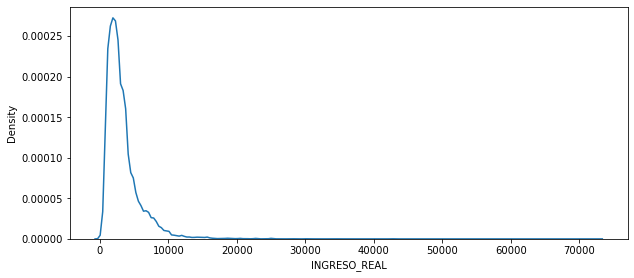

In [27]:
plot_univar(df=df_income,var='INGRESO_REAL',tipo='distribucion',ingreso='INGRESO_REAL')

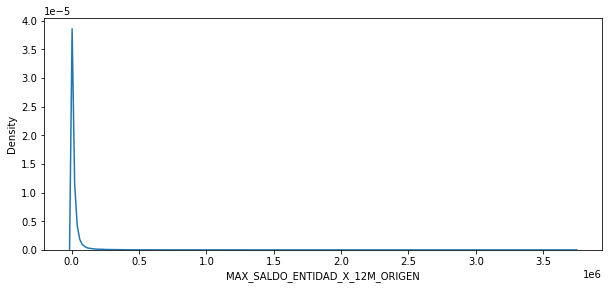

In [29]:
plot_univar(df=df_income,var='MAX_SALDO_ENTIDAD_X_12M_ORIGEN',tipo='distribucion',ingreso='INGRESO_REAL')

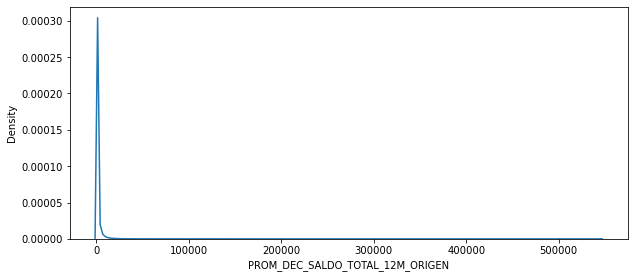

In [30]:
plot_univar(df=df_income,var='PROM_DEC_SALDO_TOTAL_12M_ORIGEN',tipo='distribucion',ingreso='INGRESO_REAL')

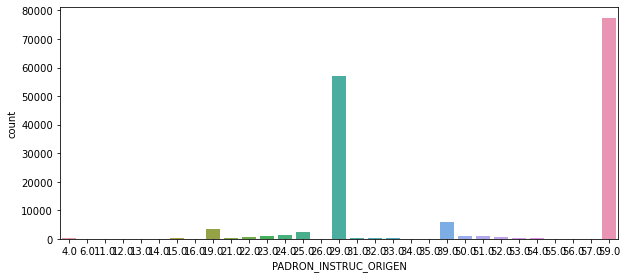

In [31]:
plot_univar(df=df_income,var='PADRON_INSTRUC_ORIGEN',tipo='barras',ingreso='INGRESO_REAL')

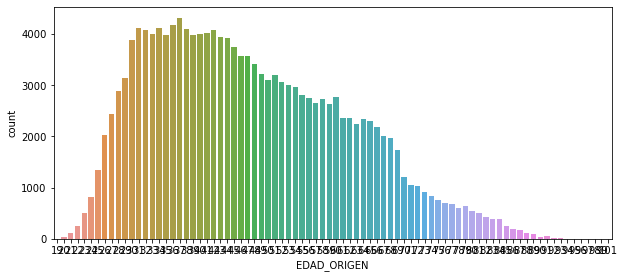

In [32]:
plot_univar(df=df_income,var='EDAD_ORIGEN',tipo='barras',ingreso='INGRESO_REAL')

# Análisis bivariado

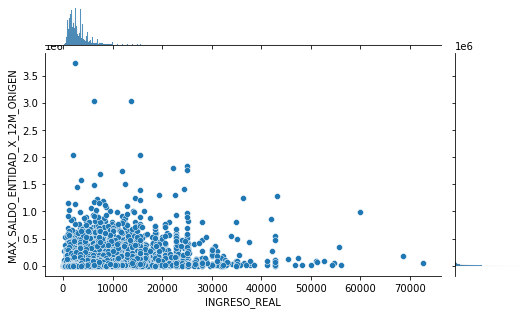

In [39]:
plot_univar(df=df_income,var='MAX_SALDO_ENTIDAD_X_12M_ORIGEN',tipo='bivariado',ingreso='INGRESO_REAL')

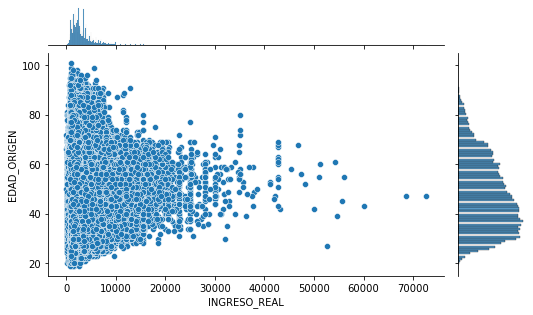

In [40]:
plot_univar(df=df_income,var='EDAD_ORIGEN',tipo='bivariado',ingreso='INGRESO_REAL')

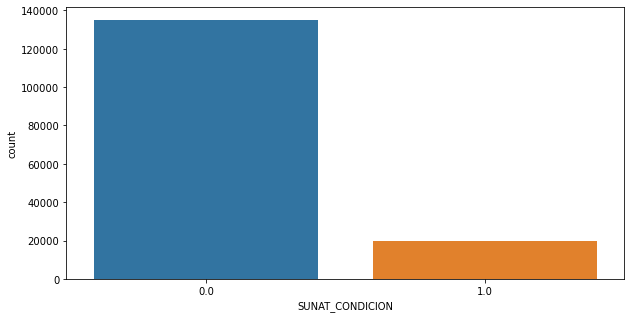

In [61]:
plot_univar(df=df_income,var='SUNAT_CONDICION',tipo='barras',ingreso='INGRESO_REAL')

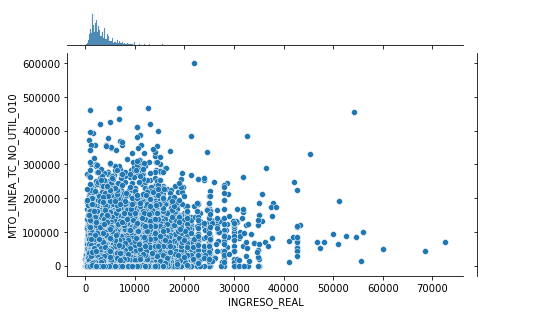

In [65]:
plot_univar(df=df_income[['MTO_LINEA_TC_NO_UTIL_010','INGRESO_REAL']],var='MTO_LINEA_TC_NO_UTIL_010',tipo='bivariado',ingreso='INGRESO_REAL')

# Identificación de outlier por rango de decir de ingresos 

Se identificó con inconsistencias en el que los clientes con bajos ingresos tienen deudas millonarias. Por ese motivo, se identificó el máximo permisible por cada grupo de ingreso

In [42]:
#fig,ax=plt.subplots(1,1,figsize=(10,5))
import plotly.express as px
from plotly.offline import plot
import plotly.graph_objects as go

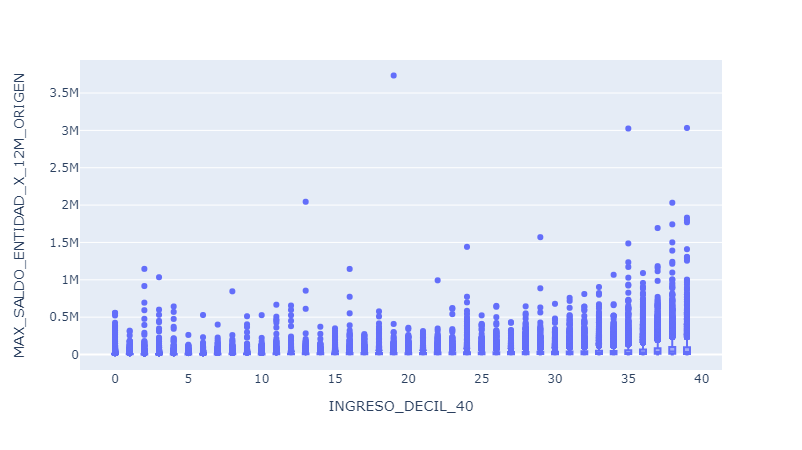

In [45]:
fig=px.box(df_income.sort_values(by=['INGRESO_DECIL_40']),x='INGRESO_DECIL_40',y='MAX_SALDO_ENTIDAD_X_12M_ORIGEN')
fig.update_layout(showlegend=False)
fig.update_traces(width=0.4)
fig.layout.update()
fig

In [95]:
def MAX_VIABLE(x):return x.quantile(0.75)+1.5*(x.quantile(0.75)-x.quantile(0.25))

def filtro_max_viable(df,var_bins,var_comp,df_percentile):
    '''
    Función para identificar los outliers por cada rango de ingresos según la variable a analizar
    input:
        df: dataframe con los datos
        var_bins: variable de ingresos
        var_comp: variable a analizar
        df_percentile: dataframe con los percentiles que contiene los rangos de ingresos
    output:
        df: dataframe que incluye la columna que identifica los outliers
        df_percentile: dataframe con los percentiles que contiene los rangos de ingresos
    '''
    if df_percentile is None:
        df_percentile=df.groupby([var_bins],as_index=False).agg({var_comp: MAX_VIABLE},as_index=False).rename(columns={var_comp:'MaxViable'})
        print(df_percentile.head(5))

    df['FLAG_EXCLUSION_'+var_comp]=0

    for kbins,ingreso in zip(df_percentile[var_bins],df_percentile['MaxViable']):
        df['FLAG_EXCLUSION_'+var_comp][(df[var_bins]==kbins)&(df[var_comp]>ingreso)]=1
        #print('Kbins:',kbins,'--> Total:',df[(df[var_bins]==kbins)].shape[0],
        #     ' Outlier:',df[(df[var_bins]==kbins)&(df[var_comp]>ingreso)].shape[0])

    #print(df['FLAG_EXCLUSION_'+var_comp].value_counts())

    return df,df_percentile

df_income,df_percentile_MAX_SALDO_ENTIDAD_X_12M_ORIGEN = filtro_max_viable(df=df_income,var_bins='INGRESO_DECIL_40',var_comp='MAX_SALDO_ENTIDAD_X_12M_ORIGEN',df_percentile=None)
df_income,df_percentile_PROM_DEC_SALDO_TOTAL_12M_ORIGEN = filtro_max_viable(df=df_income,var_bins='INGRESO_DECIL_40',var_comp='PROM_DEC_SALDO_TOTAL_12M_ORIGEN',df_percentile=None)

upload_blob("income-bucket", df_percentile_MAX_SALDO_ENTIDAD_X_12M_ORIGEN.to_parquet(), "01bd/06output/", "df_percentile_MAX_SALDO_ENTIDAD_X_12M_ORIGEN.parquet.gzip")
upload_blob("income-bucket", df_percentile_PROM_DEC_SALDO_TOTAL_12M_ORIGEN.to_parquet(), "01bd/06output/", "df_percentile_PROM_DEC_SALDO_TOTAL_12M_ORIGEN.parquet.gzip")


   INGRESO_DECIL_40     MaxViable
0                 0  18448.725000
1                 1  18105.976250
2                 2  16698.671666
3                 3  17981.827500
4                 4  18205.150000
   INGRESO_DECIL_40    MaxViable
0                 0  1530.769569
1                 1  1243.497021
2                 2  1439.208750
3                 3  1386.195670
4                 4  1302.294285
File df_percentile_MAX_SALDO_ENTIDAD_X_12M_ORIGEN.parquet.gzip uploaded to 01bd/06output/df_percentile_MAX_SALDO_ENTIDAD_X_12M_ORIGEN.parquet.gzip.
File df_percentile_PROM_DEC_SALDO_TOTAL_12M_ORIGEN.parquet.gzip uploaded to 01bd/06output/df_percentile_PROM_DEC_SALDO_TOTAL_12M_ORIGEN.parquet.gzip.


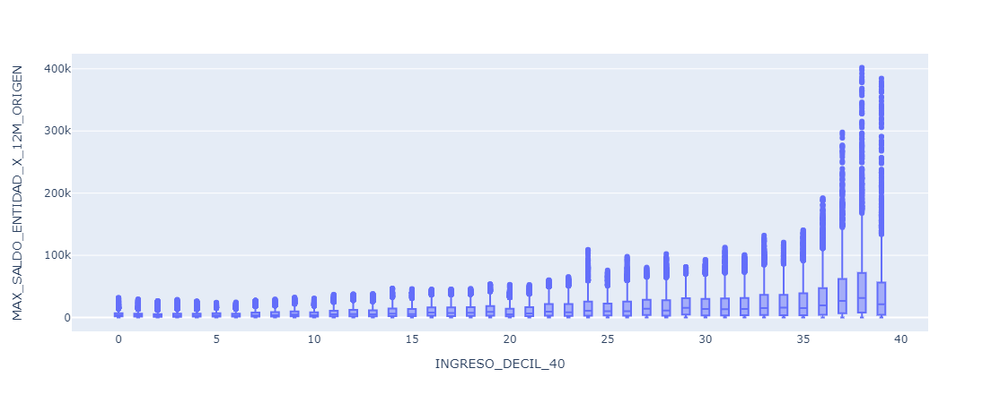

In [80]:
# Grafico del ingreso aplicando los filtros de maximo viable
import plotly.express as px
from plotly.offline import plot
import plotly.graph_objects as go

fig=px.box(df_income[(df_income['FLAG_EXCLUSION_MAX_SALDO_ENTIDAD_X_12M_ORIGEN']==0)&
                    (df_income['FLAG_EXCLUSION_PROM_DEC_SALDO_TOTAL_12M_ORIGEN']==0)].sort_values(by=['INGRESO_DECIL_40']),x='INGRESO_DECIL_40',y='MAX_SALDO_ENTIDAD_X_12M_ORIGEN')
fig.update_layout(showlegend=False)
fig.update_traces(width=0.4)
fig.layout.update()
fig

In [52]:
#Imputación de los datos
# Se imputa por el mínimo porque son los que perciben menos ingresos
# Se imputa por cero porque no tienen información de la variable

var_imp_cero=['MAX_SALDO_ENTIDAD_X_12M_ORIGEN','PROM_DEC_SALDO_TOTAL_12M_ORIGEN','SUNAT_CONDICION_ORIGEN'
             ,'PROP_TOTAL_CAST_MAX_MTO_01_12M_ORIGEN','MTO_LINEA_TC_NO_UTIL_010_ORIGEN']
var_imp_min =['EDAD_ORIGEN','PADRON_INSTRUC_ORIGEN']

df_income = imputar_min(df=df_income,var_imp=var_imp_min)
df_income = imputar_cero(df=df_income,var_imp=var_imp_cero)
df_income.set_index('nrounico', inplace=True)

In [53]:
#Transformación de variables a su logaritmo
var_log=['MAX_SALDO_ENTIDAD_X_12M_ORIGEN_IMPUTADO','PROM_DEC_SALDO_TOTAL_12M_ORIGEN_IMPUTADO','INGRESO_REAL']
for col in var_log:
  df_income[col+'_LOG']=np.log10(df_income[col]+1)

In [54]:
# Se guardan las variables con los nombres a usar en el modelo
df_income['EDAD']=df_income['EDAD_ORIGEN_IMPUTADO']
df_income['PADRON_INSTRUC']=df_income['PADRON_INSTRUC_ORIGEN_IMPUTADO']
df_income['SUNAT_CONDICION']=df_income['SUNAT_CONDICION_ORIGEN_IMPUTADO']
df_income['PROP_TOTAL_CAST_MAX_MTO_01_12M']=df_income['PROP_TOTAL_CAST_MAX_MTO_01_12M_ORIGEN_IMPUTADO']
df_income['MTO_LINEA_TC_NO_UTIL_010']=df_income['MTO_LINEA_TC_NO_UTIL_010_ORIGEN_IMPUTADO']
df_income=df_income.rename(columns={'MAX_SALDO_ENTIDAD_X_12M_ORIGEN_IMPUTADO_LOG':'MAX_SALDO_ENTIDAD_X_12M_LOG',
                                  'PROM_DEC_SALDO_TOTAL_12M_ORIGEN_IMPUTADO_LOG':'PROM_DEC_SALDO_TOTAL_12M_LOG'})

# Distribución del ingreso

Se analizó la transformación del ingreso transformado en el logaritmo. Tiende a tener un comportamiento de una distribución normal

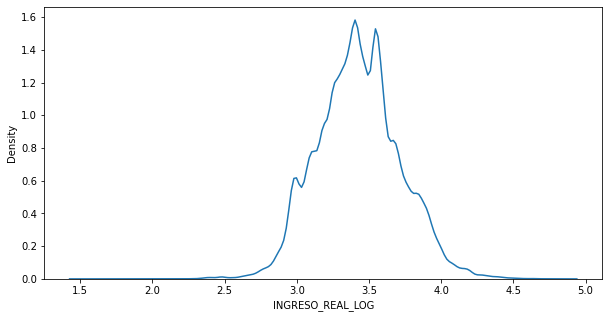

In [55]:
plot_univar(df=df_income,var='INGRESO_REAL_LOG',tipo='distribucion',ingreso='INGRESO_REAL')

Se almacena los datos en el bucket, incluyendo los filtros para que estén listos para modelar

In [84]:
df_model = df_income[(df_income['FLAG_EXCLUSION_MAX_SALDO_ENTIDAD_X_12M_ORIGEN']==0)&(df_income['FLAG_EXCLUSION_PROM_DEC_SALDO_TOTAL_12M_ORIGEN']==0)].copy()

upload_blob("income-bucket", df_model.to_parquet(), "01bd/08model/", "db_income_202107.parquet.gzip")

File db_income_202107.parquet.gzip uploaded to 01bd/08model/db_income_202107.parquet.gzip.


In [90]:
def preprocesamiento(df_income):
    '''
    Función que realiza el preprocesamiento de los datos de todo lo implementado anteriormente
    input:
        df_income: dataframe con los datos de ingresos y variables de interes
    output:
        df_income: dataframe con los resultados del preprocesamiento
    '''
    #Agregar nombre 'ORIGEN'
    ########################
    var_origin = ['MAX_SALDO_ENTIDAD_X_12M','PROM_DEC_SALDO_TOTAL_12M', 'PADRON_INSTRUC', 'EDAD','SUNAT_CONDICION',
              'PROP_TOTAL_CAST_MAX_MTO_01_12M','MTO_LINEA_TC_NO_UTIL_010']

    for col in var_origin:
        df_income=df_income.rename(columns={col:col+'_ORIGEN'})
 
    #Agregar variable 'INGRESO_DECIL_40'
    ########################  
    cutlist = list(pd.read_parquet('gs://income-bucket/01bd/06output/cut_decil40_seg_sintc.parquet.gzip')['INGRESO_REAL_MAX'])
    df_income['INGRESO_DECIL_40'] = pd.cut(df_income['INGRESO_REAL'],cutlist,labels=list(range(40)), include_lowest=True)

    #Agregar FLAG 'MAX_SALDO_ENTIDAD_X_12M_ORIGEN' y PROM_DEC_SALDO_TOTAL_12M_ORIGEN
    ########################  
    df_percentile_MAX_SALDO_ENTIDAD_X_12M_ORIGEN = pd.read_parquet('gs://income-bucket/01bd/06output/df_percentile_MAX_SALDO_ENTIDAD_X_12M_ORIGEN.parquet.gzip')

    df_income,df_percentile = filtro_max_viable(df=df_income,var_bins='INGRESO_DECIL_40',var_comp='MAX_SALDO_ENTIDAD_X_12M_ORIGEN',df_percentile=df_percentile_MAX_SALDO_ENTIDAD_X_12M_ORIGEN)


    df_percentile_PROM_DEC_SALDO_TOTAL_12M_ORIGEN = pd.read_parquet('gs://income-bucket/01bd/06output/df_percentile_PROM_DEC_SALDO_TOTAL_12M_ORIGEN.parquet.gzip')

    df_income,df_percentile = filtro_max_viable(df=df_income,var_bins='INGRESO_DECIL_40',var_comp='PROM_DEC_SALDO_TOTAL_12M_ORIGEN',df_percentile=df_percentile_PROM_DEC_SALDO_TOTAL_12M_ORIGEN)

  
    #Imputación variables
    ########################   
    var_imp_cero=['MAX_SALDO_ENTIDAD_X_12M_ORIGEN','PROM_DEC_SALDO_TOTAL_12M_ORIGEN','SUNAT_CONDICION_ORIGEN'
             ,'PROP_TOTAL_CAST_MAX_MTO_01_12M_ORIGEN','MTO_LINEA_TC_NO_UTIL_010_ORIGEN']
    var_imp_min =['EDAD_ORIGEN','PADRON_INSTRUC_ORIGEN']

    df_income = imputar_min(df=df_income,var_imp=var_imp_min)
    df_income = imputar_cero(df=df_income,var_imp=var_imp_cero)
    df_income.set_index('nrounico', inplace=True)

    #Transformación y selección final
    ######################## 
    var_log=['MAX_SALDO_ENTIDAD_X_12M_ORIGEN_IMPUTADO','PROM_DEC_SALDO_TOTAL_12M_ORIGEN_IMPUTADO','INGRESO_REAL']
    for col in var_log:
        df_income[col+'_LOG']=np.log10(df_income[col]+1)

    df_income['EDAD']=df_income['EDAD_ORIGEN_IMPUTADO']
    df_income['PADRON_INSTRUC']=df_income['PADRON_INSTRUC_ORIGEN_IMPUTADO']
    df_income=df_income.rename(columns={'MAX_SALDO_ENTIDAD_X_12M_ORIGEN_IMPUTADO_LOG':'MAX_SALDO_ENTIDAD_X_12M_LOG',
                                    'PROM_DEC_SALDO_TOTAL_12M_ORIGEN_IMPUTADO_LOG':'PROM_DEC_SALDO_TOTAL_12M_LOG'})

    df_model = df_income[(df_income['FLAG_EXCLUSION_MAX_SALDO_ENTIDAD_X_12M_ORIGEN']==0)&(df_income['FLAG_EXCLUSION_PROM_DEC_SALDO_TOTAL_12M_ORIGEN']==0)].copy()

    return df_income

In [97]:
#Se aplica la función preprocesamiento a los datos de los demás periodos.
df_income_202108 = df_final_202108.toPandas()
df_income_202109 = df_final_202109.toPandas()

df_income_202108 = preprocesamiento(df_income_202108)
df_income_202109 = preprocesamiento(df_income_202109)

#Se almacena en el bucket el dataframe con los datos preprocesados.
upload_blob("income-bucket", df_income_202108.to_parquet(), "01bd/08model/", "df_income_202108.parquet.gzip")
upload_blob("income-bucket", df_income_202109.to_parquet(), "01bd/08model/", "df_income_202109.parquet.gzip")